# NETWORK

In [1]:
%matplotlib inline
import networkx as nx
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Data

In [75]:
raw_data = pd.read_csv('Full-2020_05_10-13_14_09-X_raw_disease_50_target_100_7217_by_101.csv')
raw_data.head()

,Unnamed: 0,ENSG00000025039,ENSG00000048649,ENSG00000079459,ENSG00000102096,ENSG00000102580,ENSG00000103522,ENSG00000117151,ENSG00000117399,ENSG00000122786,...,ENSG00000279454,ENSG00000279774,ENSG00000279861,ENSG00000283202,ENSG00000284416,ENSG00000287234,ENSG00000287291,ENSG00000287329,ENSG00000287565,COVID
0,EFO_0000209,0.0,0.0,0.000,0.0,0.0,0.0,0.000000,0.000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.001827
1,EFO_0000537,0.0,0.0,0.014,0.0,0.0,0.0,0.022289,0.006,0.064156,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.001435
2,EFO_0000760,0.0,0.0,0.000,0.0,0.0,0.0,0.000000,0.000,0.022000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002511
3,EFO_0005109,0.0,0.0,0.000,0.0,0.0,0.0,0.000000,0.000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003721
4,EFO_0005194,0.0,0.0,0.000,0.0,0.0,0.0,0.000000,0.000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000201


In [3]:
disease_list = list(raw_data['Unnamed: 0'])
gene_list = list(raw_data.columns)[1:]

In [5]:
# processing names and codes
df_diseases_names = pd.read_csv('disease_list.csv')
d_codes = list(df_diseases_names.efo_id)
d_names = list(df_diseases_names.disease_full_name)
diseases_names = {d_codes[i]:d_names[i] for i in range(len(d_codes)) }
diseases_names['COVID'] = 'COVID'

df_genes_names = pd.read_csv('target_list.csv')
g_codes = list(df_genes_names.ensembl_id)
g_names = list(df_genes_names.hgnc_approved_symbol)
genes_names = {g_codes[i]:g_names[i] for i in range(len(g_codes)) }
genes_names['COVID'] = 'COVID'

In [6]:
# Data for Graph

data = []
for i in range(len(raw_data)):
    disease = raw_data.iloc[i]
    disease_name = diseases_names[disease['Unnamed: 0']]
    edges = [(disease_name, genes_names[gene], disease[gene]) for gene in gene_list if disease[gene] != 0]
    if len(edges) > 0:
        data.extend(edges)

In [7]:
# Graph Creation
Graph = nx.Graph()
diseases = np.unique([data[i][0] for i in range(len(data))])
genes = np.unique([data[i][1] for i in range(len(data))])
Graph.add_nodes_from(diseases, label = 'Disease')
Graph.add_nodes_from(genes, label = 'Gene')
Graph.add_weighted_edges_from(data)

In [8]:
nodelist = {}
nodelist['Diseases'] = diseases
nodelist['Genes'] = genes

In [78]:
# score each disease was associated to covid
score = list(raw_data.COVID)
covid_score = {diseases_names[disease_list[i]]: score[i] for i in range(len(score))}

In [167]:
covid_score_list = [(d,covid_score[d]) for d in covid_score]
covid_score_list.sort(key=custom_sort, reverse = True)

# 2. Data analysis

In [9]:
print('Number of nodes: {}'.format(len(Graph.nodes)))
print('Number of edges: {}'.format(len(Graph.edges)))

Number of nodes: 7265
Number of edges: 20541


In [10]:
# infos dict initialization
Graph_infos = {}

No handles with labels found to put in legend.


Min degree connection: 1

Max degree connection: 7217

Median degree connection: 1.0

Mean degree connection: 5.654783207157605

75% quantile degree connection: 3.0

25% quantile degree connection: 1.0



No handles with labels found to put in legend.


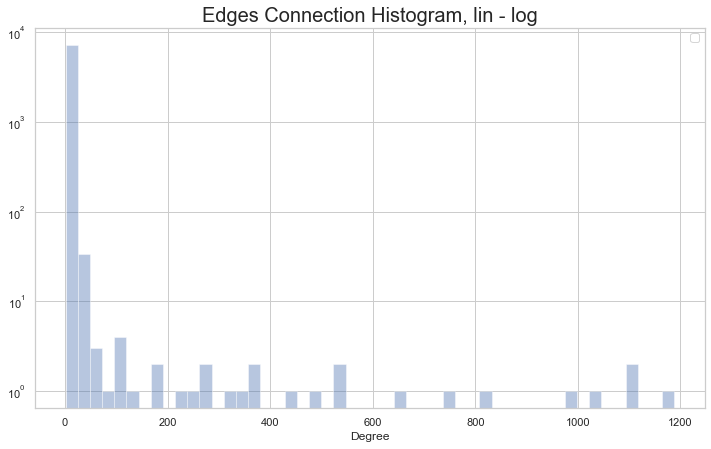

In [12]:
# Degree (number of edges at each node) for all nodes in order to have the main stats (max,min,meand,median,quantile) and plot

Graph_infos['Degrees'] = dict(nx.degree(Graph))

# only values
degrees_val = [Graph_infos['Degrees'][node] for node in Graph_infos['Degrees']]

#stats
degree_min = np.min(degrees_val)
print('Min degree connection: {}'.format(degree_min))
print('')

degree_max = np.max(degrees_val)
print('Max degree connection: {}'.format(degree_max))
print('')

degree_median = np.median(degrees_val)
print('Median degree connection: {}'.format(degree_median))
print('')

degree_mean = np.mean(degrees_val)
print('Mean degree connection: {}'.format(degree_mean))
print('')

degree_u_quant = np.quantile(degrees_val,0.75)
print('75% quantile degree connection: {}'.format(degree_u_quant))
print('')

degree_l_quant = np.quantile(degrees_val,0.25)
print('25% quantile degree connection: {}'.format(degree_l_quant))
print('')

# remove covid for histogram
degrees_val.remove(np.max(degrees_val))

# Degree histogram
plt.figure(figsize=(12,7)) 
sns.set(style = "whitegrid") 
 
sns.distplot(degrees_val,axlabel="Degree",kde=False)


plt.legend()
plt.yscale('log')
plt.title("Edges Connection Histogram, lin - log", fontsize = 20) # for histogram title
plt.savefig('Degrees_full.png')
plt.legend()

Min degree connection: 1

Max degree connection: 32

Median degree connection: 1.0

Mean degree connection: 2.846196480532077

75% quantile degree connection: 3.0

25% quantile degree connection: 1.0



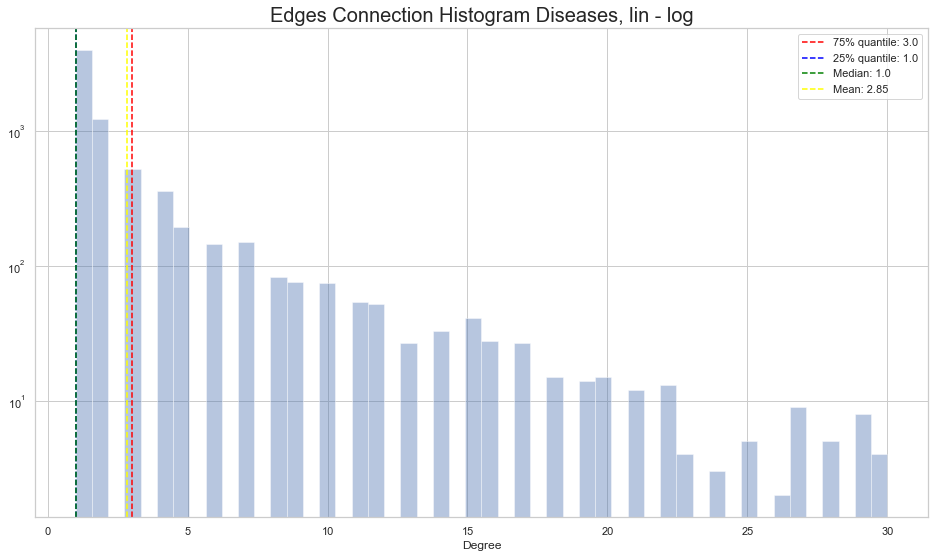

In [15]:
# Degree histogram Diseases
degrees_val_disease = [Graph_infos['Degrees'][d] for d in diseases]


#stats
degree_min = np.min(degrees_val_disease)
print('Min degree connection: {}'.format(degree_min))
print('')

degree_max = np.max(degrees_val_disease)
print('Max degree connection: {}'.format(degree_max))
print('')

degree_median = np.median(degrees_val_disease)
print('Median degree connection: {}'.format(degree_median))
print('')

degree_mean = np.mean(degrees_val_disease)
print('Mean degree connection: {}'.format(degree_mean))
print('')

degree_u_quant = np.quantile(degrees_val_disease,0.75)
print('75% quantile degree connection: {}'.format(degree_u_quant))
print('')

degree_l_quant = np.quantile(degrees_val_disease,0.25)
print('25% quantile degree connection: {}'.format(degree_l_quant))
print('')

# remove covid for histogram
degrees_val_disease.remove(np.max(degrees_val_disease))

plt.figure(figsize=(16,9)) 
sns.set(style = "whitegrid")
 
sns.distplot(degrees_val_disease,axlabel="Degree",kde=False)
plt.axvline(degree_u_quant, color = 'red', linestyle = '--', label = '75% quantile: {}'.format(degree_u_quant))
plt.axvline(degree_l_quant, color = 'blue', linestyle = '--', label = '25% quantile: {}'.format(degree_l_quant))
plt.axvline(degree_median, color = 'green', linestyle = '--', label = 'Median: {}'.format(degree_median))
plt.axvline(degree_mean, color = 'yellow', linestyle = '--', label = 'Mean: {}'.format(round(degree_mean,2)))
plt.legend()

plt.yscale('log')
plt.title("Edges Connection Histogram Diseases, lin - log", fontsize = 20) # for histogram title
plt.savefig('Degrees_diseases.png')
plt.show()

7217
Min degree connection: 1

Max degree connection: 7217

Median degree connection: 123.5

Mean degree connection: 427.9375

75% quantile degree connection: 453.0

25% quantile degree connection: 3.75



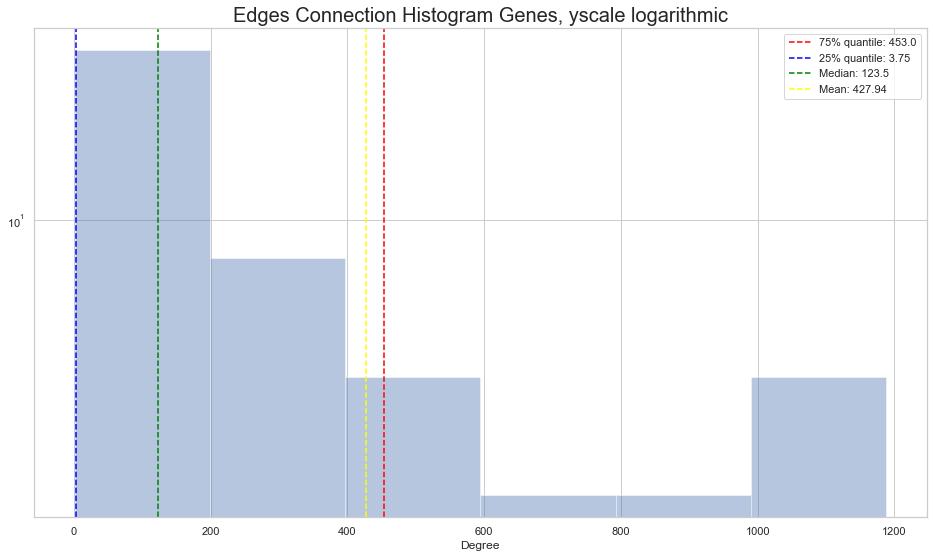

In [16]:
# Degree histogram Genes
degrees_val_genes = [Graph_infos['Degrees'][g] for g in genes]
print(max(degrees_val_genes))

#stats
degree_min = np.min(degrees_val_genes)
print('Min degree connection: {}'.format(degree_min))
print('')

degree_max = np.max(degrees_val_genes)
print('Max degree connection: {}'.format(degree_max))
print('')

degree_median = np.median(degrees_val_genes)
print('Median degree connection: {}'.format(degree_median))
print('')

degree_mean = np.mean(degrees_val_genes)
print('Mean degree connection: {}'.format(degree_mean))
print('')

degree_u_quant = np.quantile(degrees_val_genes,0.75)
print('75% quantile degree connection: {}'.format(degree_u_quant))
print('')

degree_l_quant = np.quantile(degrees_val_genes,0.25)
print('25% quantile degree connection: {}'.format(degree_l_quant))
print('')

# remove covid for histogram
degrees_val_genes.remove(np.max(degrees_val_genes))

plt.figure(figsize=(16,9)) 
sns.set(style = "whitegrid") 
 
sns.distplot(degrees_val_genes,axlabel="Degree",kde=False)
plt.axvline(degree_u_quant, color = 'red', linestyle = '--', label = '75% quantile: {}'.format(degree_u_quant))
plt.axvline(degree_l_quant, color = 'blue', linestyle = '--', label = '25% quantile: {}'.format(degree_l_quant))
plt.axvline(degree_median, color = 'green', linestyle = '--', label = 'Median: {}'.format(degree_median))
plt.axvline(degree_mean, color = 'yellow', linestyle = '--', label = 'Mean: {}'.format(round(degree_mean,2)))
plt.legend()

plt.yscale('log')
plt.title("Edges Connection Histogram Genes, yscale logarithmic", fontsize = 20) # for histogram title
plt.show()

# Centrailities

In [18]:
Graph_centrality = {}


## Commented for computational time, dataframe loaded below

### Weighted centralities
Graph_centrality = {}

deg_cen = dict(Graph.degree(Graph, weight = 'weight'))
Graph_centrality['Degree Centrality'] = deg_cen

clo_cen = nx.closeness_centrality(Graph)
Graph_centrality['Closeness Centrality'] = clo_cen

bw_cen = nx.betweenness_centrality(Graph, weight = 'weight')
Graph_centrality['Betweeness Centrality'] = bw_cen

pr_cen = nx.pagerank(Graph, weight = 'weight')
Graph_centrality['Pagerank Centrality'] = pr_cen

#eig_cen = nx.eigenvector_centrality(Graph, weight = 'weight')
#Graph_centrality['Eigenvector Centrality'] = eig_cen

df_cen = pd.DataFrame.from_dict(Graph_centrality)

pd.DataFrame.to_csv(df_cen,'Centralities_weighted.csv')

In [19]:
centralities_w = pd.read_csv('Centralities_weighted.csv')
centralities_w_dict = centralities_w.to_dict('series')

In [20]:
centralities_w.head()

,Column1,Degree Centrality,Closeness Centrality,Betweeness Centrality,Pagerank Centrality
0,ENSG00000169432,668.462446,0.371655,2.753300e-04,0.078392
1,ENSG00000103522,314.903177,0.367370,0.000000e+00,0.039254
2,ENSG00000187735,207.955171,0.350969,6.820000e-07,0.021354
3,ENSG00000165646,206.871757,0.369237,1.100601e-03,0.028321
4,ENSG00000213398,172.568817,0.374723,1.112031e-03,0.028632


In [21]:
centrality_w_names = list(centralities_w.columns)[1:]
disease_codes = list(centralities_w['Column1'])

In [22]:
Graph_centrality_w = {}
for col in centrality_w_names:
    Graph_centrality_w[col] = {disease_codes[i]: centralities_w_dict[col][i] for i in range(len(disease_codes))}

In [23]:
# Set appropriate names to genes since not preent in dataframe loaded
for cen in Graph_centrality_w:
    nodes = list(Graph_centrality_w[cen].keys())
    for node in nodes:
        try: 
            label = Graph.nodes[node]['label']
                
        except KeyError:
            print('error')
            gene_name = genes_names[node]
            
            Graph_centrality_w[cen][gene_name] = Graph_centrality_w[cen][node]
            print(Graph_centrality_w[cen][gene_name])
            del Graph_centrality_w[cen][node]
            

error
668.4624461
error
314.9031773
error
207.9551714
error
206.8717573
error
172.56881669999999
error
143.78162939999999
error
133.6433112
error
97.05999763
error
78.43858238
error
71.25107951
error
64.75367234
error
52.28954195
error
49.00863021
error
45.63681324
error
35.68519156
error
30.07005342
error
29.44025459
error
28.13992104
error
27.34125399
error
25.94482457
error
24.8436543
error
16.94291568
error
6.895714900000001
error
6.5616201489999995
error
4.930807589
error
3.806871475
error
3.325584778
error
2.835014316
error
2.62250298
error
1.9984705630000001
error
1.793884424
error
0.7116176040000001
error
0.36312
error
0.23848219
error
0.212946873
error
0.18454015699999998
error
0.125644758
error
0.111815253
error
0.11061411300000001
error
0.1089
error
0.106106202
error
0.08514
error
0.044843281
error
0.029626525
error
0.016165305
error
0.007527913000000001
error
0.005849236
error
0.371655155
error
0.367369645
error
0.350968739
error
0.369237025
error
0.374722724
error
0.361123

In [24]:
# in order to sort dicitonaries
import operator

In [25]:
#list to dict function
def list_to_dict(a):
    d = {a[j][0]:a[j][1] for j in range(len(a)) }

    return d

In [98]:
def custom_sort(t):
    return t[1]

In [137]:
# print top 10 nodes for given centrality measure
def top_print(name,centrality,n, nodelist, label):
    
    # sort the centrality to have the best above
    centrality_label = [(node, centrality[node]) for node in nodelist]
    centrality_label.sort(key=custom_sort, reverse = True)
    
    nodes = [node[0] for node in centrality_label][:n]
    
    print('-------------------------------------------')
    print("{}: WEIGHTED CENTRALITY MEASURE BY {}".format(label.upper(), name.upper()))
    print(' ')
    for k in range(0,n):
    # depends for decimals or not
        if centrality_label[k][1] > 1:
            print("{}. {}: {:.0F}".format(k+1,centrality_label[k][0].upper(),centrality_label[k][1]))
        else:
            print("{}. {}: {:.5F}".format(k+1,centrality_label[k][0].upper(),centrality_label[k][1]))
        k = k+1
    return nodes

In [138]:
#execute function for diseases
results = {}
for k in Graph_centrality_w:
    centrality = Graph_centrality_w[k]
    name = k
    results[k] = top_print(name,centrality,10,list(diseases), 'Disease' )

-------------------------------------------
DISEASE: WEIGHTED CENTRALITY MEASURE BY DEGREE CENTRALITY
 
1. MEASUREMENT: 14
2. GENETIC DISORDER: 13
3. GENETIC, FAMILIAL OR CONGENITAL DISEASE: 13
4. CELL PROLIFERATION DISORDER: 12
5. NEOPLASTIC DISEASE OR SYNDROME: 12
6. NEOPLASM: 12
7. CANCER: 12
8. RESPIRATORY OR THORACIC DISEASE: 11
9. THORACIC DISEASE: 11
10. EPITHELIAL NEOPLASM: 10
-------------------------------------------
DISEASE: WEIGHTED CENTRALITY MEASURE BY CLOSENESS CENTRALITY
 
1. MEASUREMENT: 0.50055
2. CELL PROLIFERATION DISORDER: 0.50041
3. NEOPLASM: 0.50041
4. NEOPLASTIC DISEASE OR SYNDROME: 0.50041
5. NERVOUS SYSTEM DISEASE: 0.50041
6. BONE DISEASE: 0.50034
7. BRAIN DISEASE: 0.50034
8. CENTRAL NERVOUS SYSTEM DISEASE: 0.50034
9. CONNECTIVE TISSUE DISEASE: 0.50034
10. HEMATOLOGICAL MEASUREMENT: 0.50034
-------------------------------------------
DISEASE: WEIGHTED CENTRALITY MEASURE BY BETWEENESS CENTRALITY
 
1. UTERINE DISEASE: 0.04301
2. PARALYSIS: 0.02283
3. SHORT STAT

In [142]:
#execute function for diseases
results = {}
for k in Graph_centrality_w:
    centrality = Graph_centrality_w[k]
    name = k
    results[k] = top_print(name,centrality,10,list(genes), 'Genes' )

-------------------------------------------
GENES: WEIGHTED CENTRALITY MEASURE BY DEGREE CENTRALITY
 
1. SCN9A: 668
2. IL21R: 315
3. TCEA1: 208
4. SLC18A2: 207
5. LCAT: 173
6. PDGFD: 144
7. CALD1: 134
8. DNAJC3: 97
9. TRIM13: 78
10. CDC20: 71
-------------------------------------------
GENES: WEIGHTED CENTRALITY MEASURE BY CLOSENESS CENTRALITY
 
1. COVID: 0.99357
2. LCAT: 0.37472
3. SCN9A: 0.37166
4. CALD1: 0.37150
5. SLC18A2: 0.36924
6. IL21R: 0.36737
7. PDGFD: 0.36112
8. FDFT1: 0.35859
9. DHRS11: 0.35568
10. CDC20: 0.35114
-------------------------------------------
GENES: WEIGHTED CENTRALITY MEASURE BY BETWEENESS CENTRALITY
 
1. COVID: 0.99939
2. FDFT1: 0.04311
3. PDGFD: 0.02273
4. PKIG: 0.00275
5. FKBP10: 0.00275
6. LCAT: 0.00111
7. SLC18A2: 0.00110
8. CDC20: 0.00110
9. CALD1: 0.00083
10. RRAGD: 0.00083
-------------------------------------------
GENES: WEIGHTED CENTRALITY MEASURE BY PAGERANK CENTRALITY
 
1. COVID: 0.13218
2. SCN9A: 0.07839
3. IL21R: 0.03925
4. LCAT: 0.02863
5. SLC

In [150]:
def overall_ranking(G, G_centrality, n_top, G_infos, nodelist):
    ''' G: Graph
        G_centrality: centralities dict 
        n_top (int): number of nodes to be printed
        G_infos (dict)'''
    
    centralities = list(G_centrality.keys())
    
    # dict in order to have the ranking {best node 1: 1, best node 2: 2} for each centrality
    centrality_ranked = {}
    
    # for each key in the overall_rank dict, have the ranking they have in each centrality
    overall_rank = {n: [] for n in nodelist}

    for cen in centralities:
        centrality_label = {n: G_centrality[cen][n] for n in nodelist}
        ranking = sorted(centrality_label.items(),key = operator.itemgetter(1),reverse = True)
        
        centrality_ranked[cen] = {ranking[n][0]: n+1 for n in range(0,len(ranking))}
        
        for node in nodelist:
            overall_rank[node].append(centrality_ranked[cen][node])
        
    # sum the points each nodes earned in the ranking in the centralities
    total = {node: np.sum(overall_rank[node]) for node in nodelist}
    
    # sort in order to have the n_tops nodes in increasing order
    total_ranking = sorted(total.items(),key = operator.itemgetter(1),reverse = False)
    
    top_nodes = [total_ranking[i][0] for i in range(n_top)]
    results = {}
    
    print('OVERALL RANKING')

        
    for i in range(len(top_nodes)):
        node = top_nodes[i]
        results[node] = {}
        print('')
        print('------------------')
        print('Node: {}'.format(node.upper()))
        print('')
        print('No: {} in centrality overall ranking'.format(i+1))
        results[node]['Overall Ranking'] = i+1
        print('')
        print('Specificity:')
        print('')
        print('Number of connections: {}'.format(G_infos['Degrees'][node]))
        results[node]['Number of connections'] = G_infos['Degrees'][node]
        
        print('')
        for j in range(len(centralities)):
            print('No: {} in {} ranking'.format(overall_rank[node][j], str(centralities[j])))
            results[node][str(centralities[j])] = overall_rank[node][j]
        
        
    return centrality_ranked, total_ranking

In [151]:
centrality_ranked_d,total_ranking_d = overall_ranking(Graph, Graph_centrality_w,10, Graph_infos,diseases)

OVERALL RANKING

------------------
Node: BONE DISEASE

No: 1 in centrality overall ranking

Specificity:

Number of connections: 29

No: 40 in Degree Centrality ranking
No: 6 in Closeness Centrality ranking
No: 49 in Betweeness Centrality ranking
No: 37 in Pagerank Centrality ranking

------------------
Node: PSYCHIATRIC DISORDER

No: 2 in centrality overall ranking

Specificity:

Number of connections: 28

No: 62 in Degree Centrality ranking
No: 18 in Closeness Centrality ranking
No: 17 in Betweeness Centrality ranking
No: 60 in Pagerank Centrality ranking

------------------
Node: BIOLOGICAL PROCESS

No: 3 in centrality overall ranking

Specificity:

Number of connections: 25

No: 79 in Degree Centrality ranking
No: 30 in Closeness Centrality ranking
No: 38 in Betweeness Centrality ranking
No: 74 in Pagerank Centrality ranking

------------------
Node: PROTEIN MEASUREMENT

No: 4 in centrality overall ranking

Specificity:

Number of connections: 27

No: 137 in Degree Centrality rank

In [155]:
centrality_ranked_g,total_ranking_g = overall_ranking(Graph, Graph_centrality_w,10, Graph_infos,genes)

OVERALL RANKING

------------------
Node: LCAT

No: 1 in centrality overall ranking

Specificity:

Number of connections: 1188

No: 5 in Degree Centrality ranking
No: 2 in Closeness Centrality ranking
No: 6 in Betweeness Centrality ranking
No: 4 in Pagerank Centrality ranking

------------------
Node: SCN9A

No: 2 in centrality overall ranking

Specificity:

Number of connections: 1103

No: 1 in Degree Centrality ranking
No: 3 in Closeness Centrality ranking
No: 12 in Betweeness Centrality ranking
No: 2 in Pagerank Centrality ranking

------------------
Node: SLC18A2

No: 3 in centrality overall ranking

Specificity:

Number of connections: 1041

No: 4 in Degree Centrality ranking
No: 5 in Closeness Centrality ranking
No: 7 in Betweeness Centrality ranking
No: 5 in Pagerank Centrality ranking

------------------
Node: PDGFD

No: 4 in centrality overall ranking

Specificity:

Number of connections: 818

No: 6 in Degree Centrality ranking
No: 7 in Closeness Centrality ranking
No: 3 in Be

# 4. Graph Representation

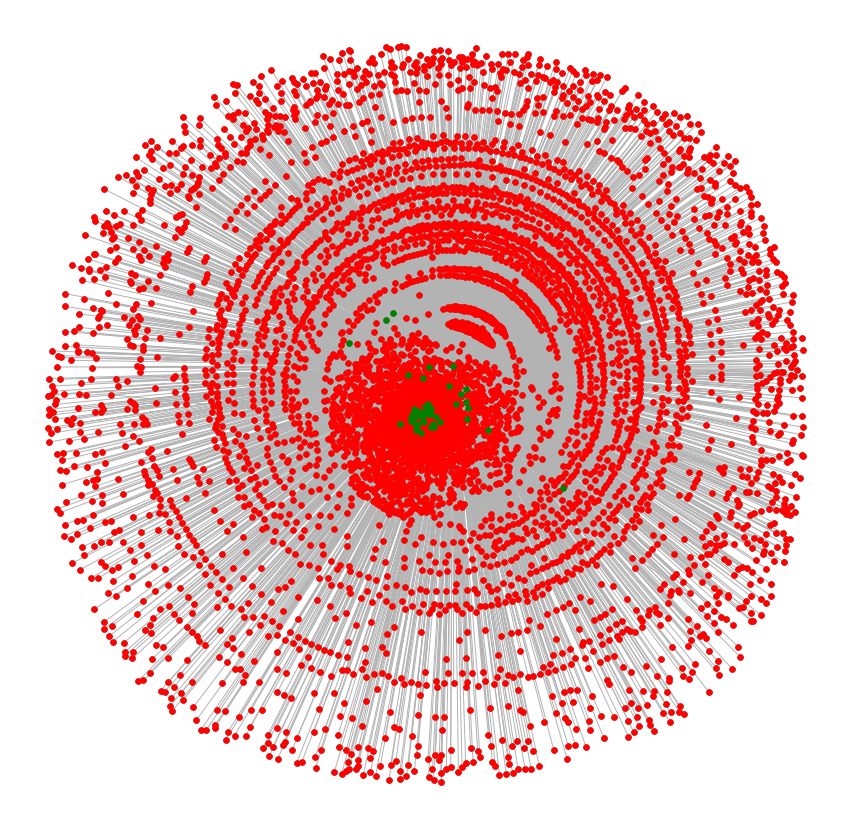

In [181]:
plt.figure(figsize=(15,15))

# Load
layout = np.load('layout_nx.npy',allow_pickle='TRUE').item()

# draw base etwork
nx.draw_networkx(Graph, pos = layout, node_size = 30, with_labels = False, node_color = 'grey', edge_color = '0.7')

# add bigger nodes in color
nodelist = list(Graph.nodes())
nodelist_d =  list(diseases)
nodelist_g = list(genes)

nx.draw_networkx_nodes(Graph,pos=layout,nodelist= nodelist_d, node_color='red', node_size = 30)
nx.draw_networkx_nodes(Graph,pos=layout,nodelist= nodelist_g, node_color='green', node_size = 30)



#plt.title(name + ': '+node_type, fontsize = 20)
plt.savefig('full_network.png')
plt.axis("off")
plt.show()

In [38]:
def draw_graph_top(G,centrality_ranked,n, layout, name, node_list, node_type):
    
    plt.figure(figsize=(15,15))

    
    # draw base etwork 
    nx.draw_networkx(G, pos = layout, node_size = 30, with_labels = False, node_color = 'grey', edge_color = '0.7')
    
    # add bigger nodes in color
    top_nodes = list(centrality_ranked.keys())[:n]
    labels = {i: i for i in top_nodes}
    colors = ['#1ECD3F', '#0C437E', '#30F77B', '#E0016D', '#E0C6F4', '#A402CF', '#6C5020', '#014F05', '#3636DE', '#0E82F6']
    big_size = 3000
    sizes = [big_size/(i+1) for i in range(n)]
        
    nx.draw_networkx_nodes(G,pos=layout,nodelist= top_nodes, with_labels = True, node_color=colors, node_size = sizes)
        
    nx.draw_networkx_labels(G,layout, labels,font_size=16, font_color = 'k') 
    
    
    plt.title(name + ': '+node_type, fontsize = 20)
    plt.savefig(name+'_'+node_type+'_centrality.png')
    plt.axis("off")
    plt.show()

In [39]:
# Load
layout = np.load('layout_nx.npy',allow_pickle='TRUE').item()

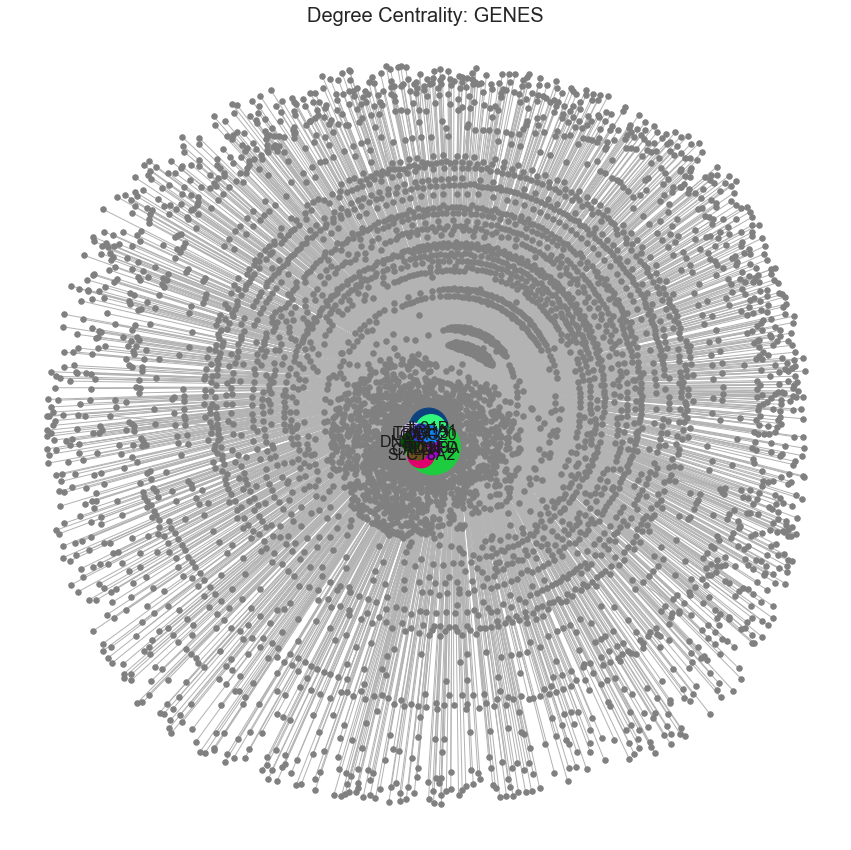

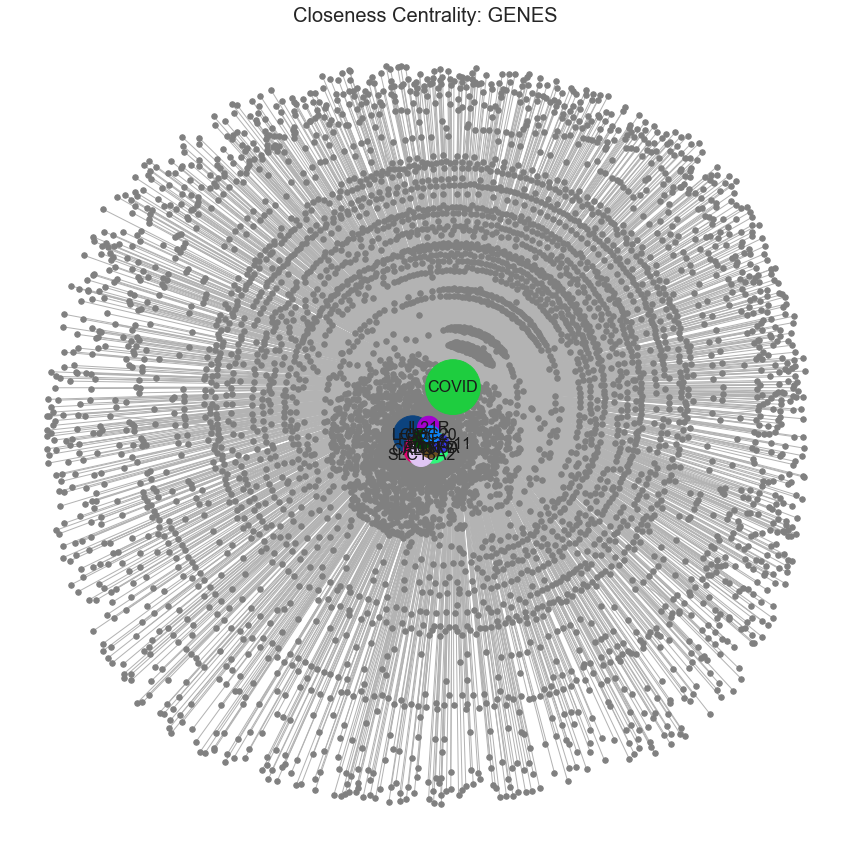

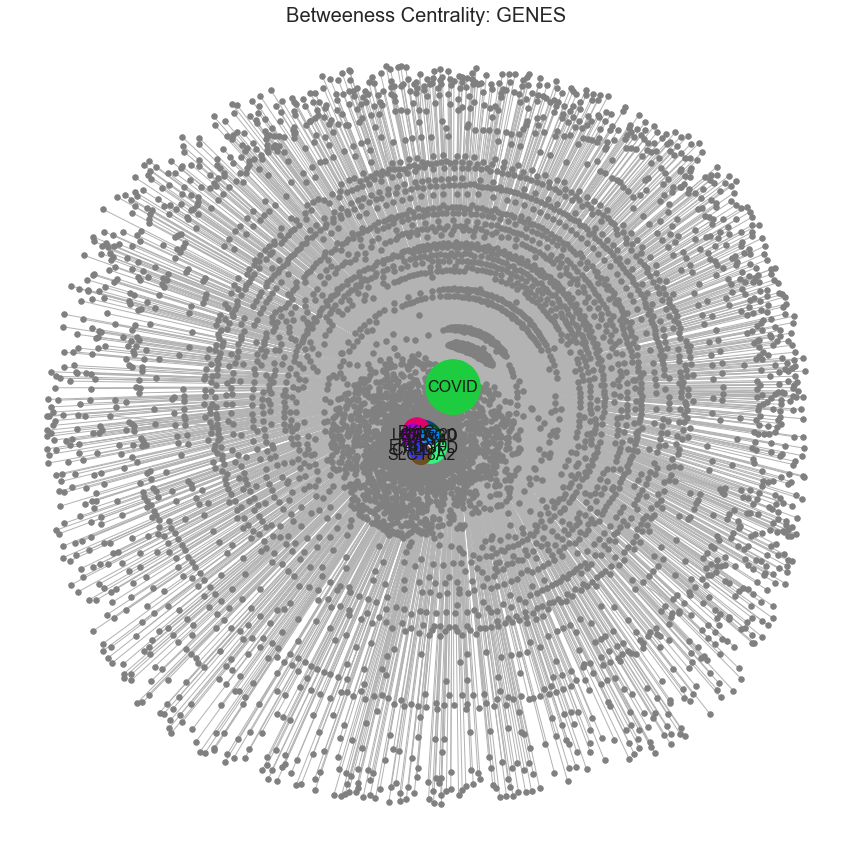

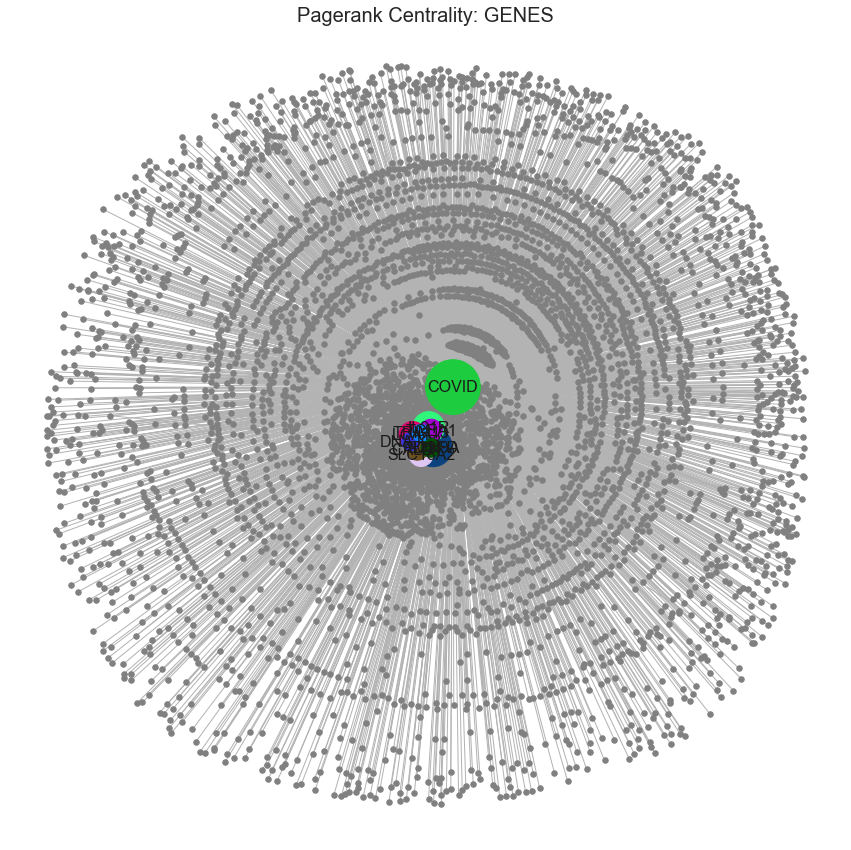

In [40]:
for cen in centrality_ranked_g:
    draw_graph_top(Graph,centrality_ranked_g[cen],10, layout, str(cen),genes, 'GENES')

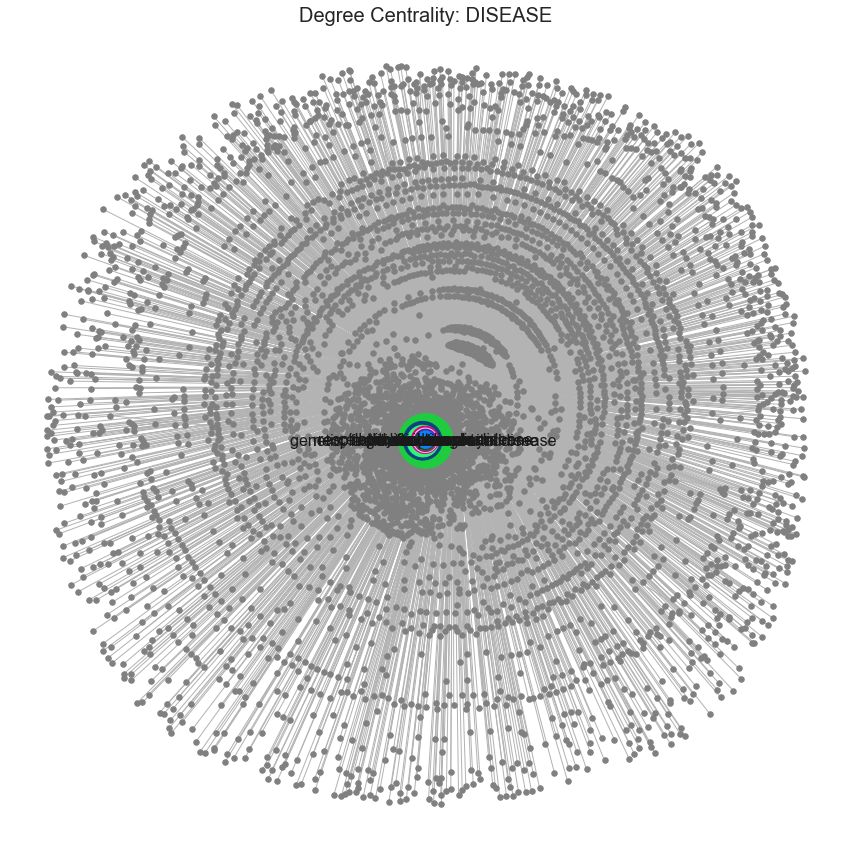

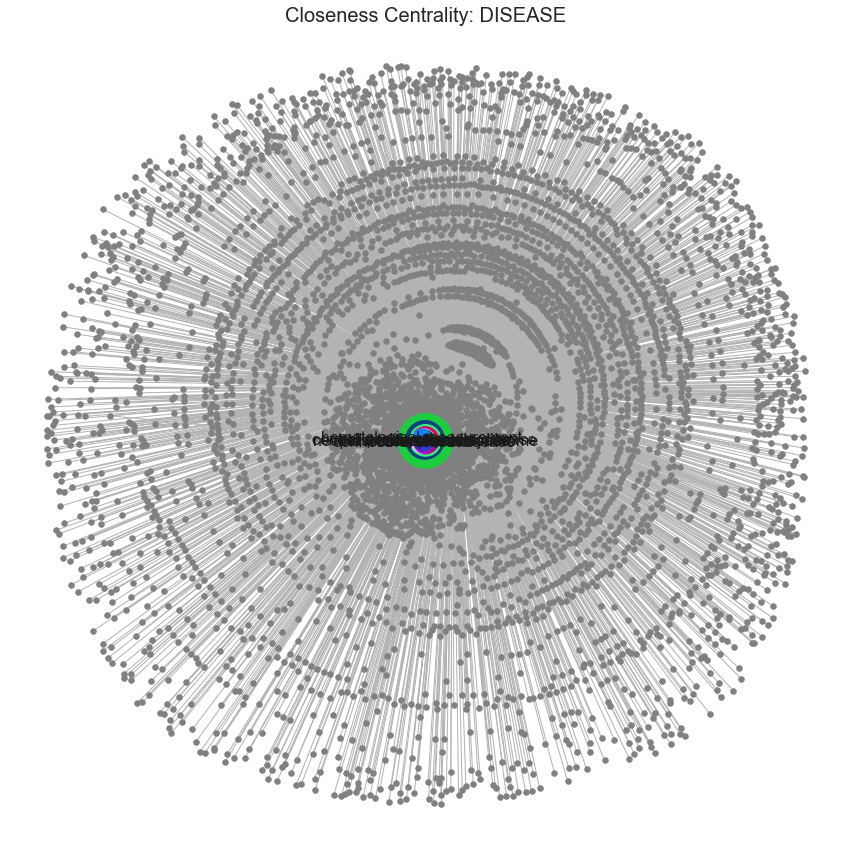

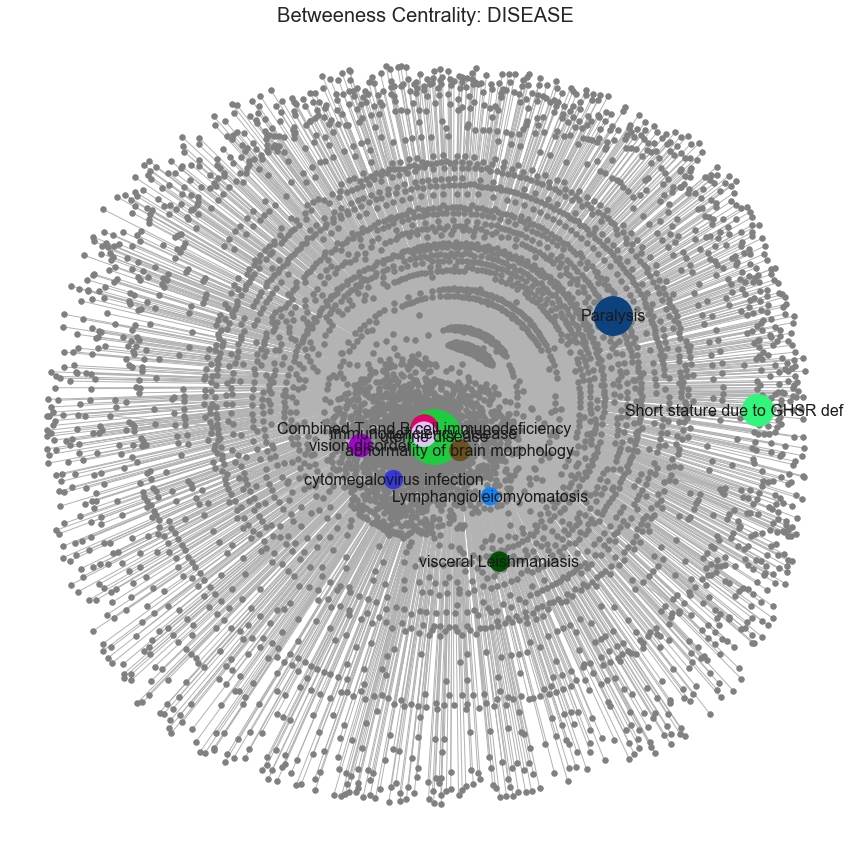

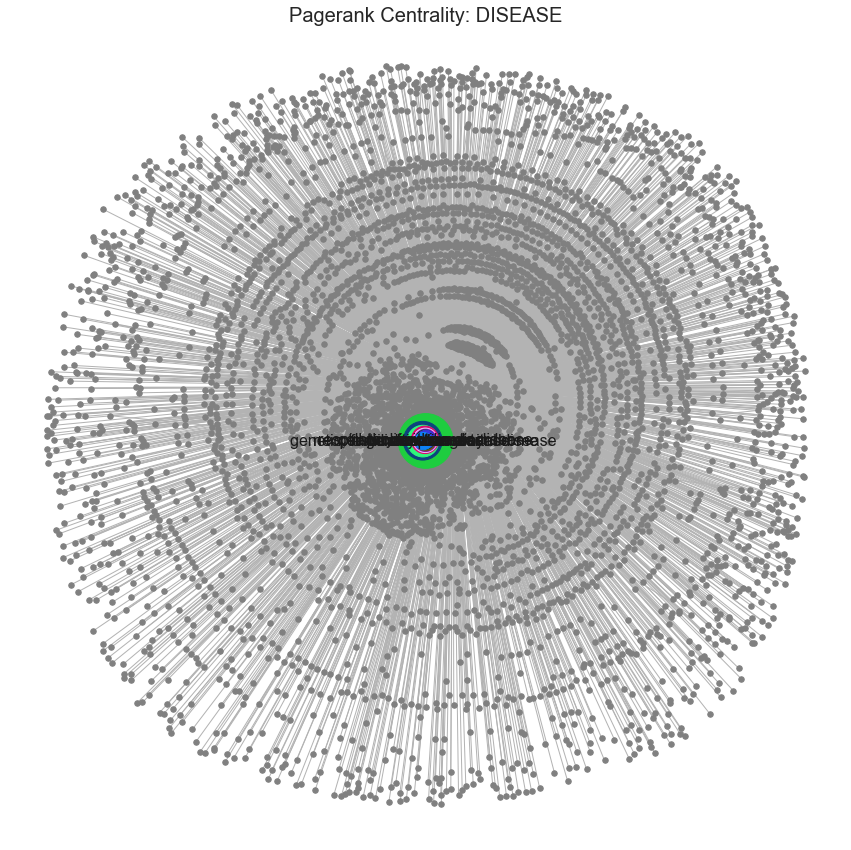

In [41]:
for cen in centrality_ranked_d:
    draw_graph_top(Graph,centrality_ranked_d[cen],10, layout, str(cen),diseases, 'DISEASE')

   

In [183]:
total_ranking_d

[('bone disease', 132),
 ('psychiatric disorder', 157),
 ('biological process', 221),
 ('protein measurement', 290),
 ('diabetes mellitus', 367),
 ('colorectal cancer', 414),
 ('non-small cell lung carcinoma', 414),
 ('liver disease', 416),
 ('autoimmune disease', 502),
 ('squamous cell carcinoma', 512),
 ('Acute Leukemia', 618),
 ('blood protein measurement', 649),
 ('uterine disease', 908),
 ('colorectal adenocarcinoma', 946),
 ('injury, poisoning or other complication', 977),
 ('Abnormality of nervous system physiology', 1010),
 ('Abnormality of the cardiovascular system', 1027),
 ('Central Nervous System Neoplasm', 1109),
 ('immunodeficiency disease', 1123),
 ('biliary tract disease', 1223),
 ('hepatocellular carcinoma', 1279),
 ('Abnormal eye movements', 1476),
 ('Digestive System Carcinoma', 1479),
 ('arthritis', 1483),
 ('joint disease', 1527),
 ('bone inflammation disease', 1550),
 ('Abnormality of skeletal morphology', 1567),
 ('Anomaly of puberty or/and menstrual cycle of gen

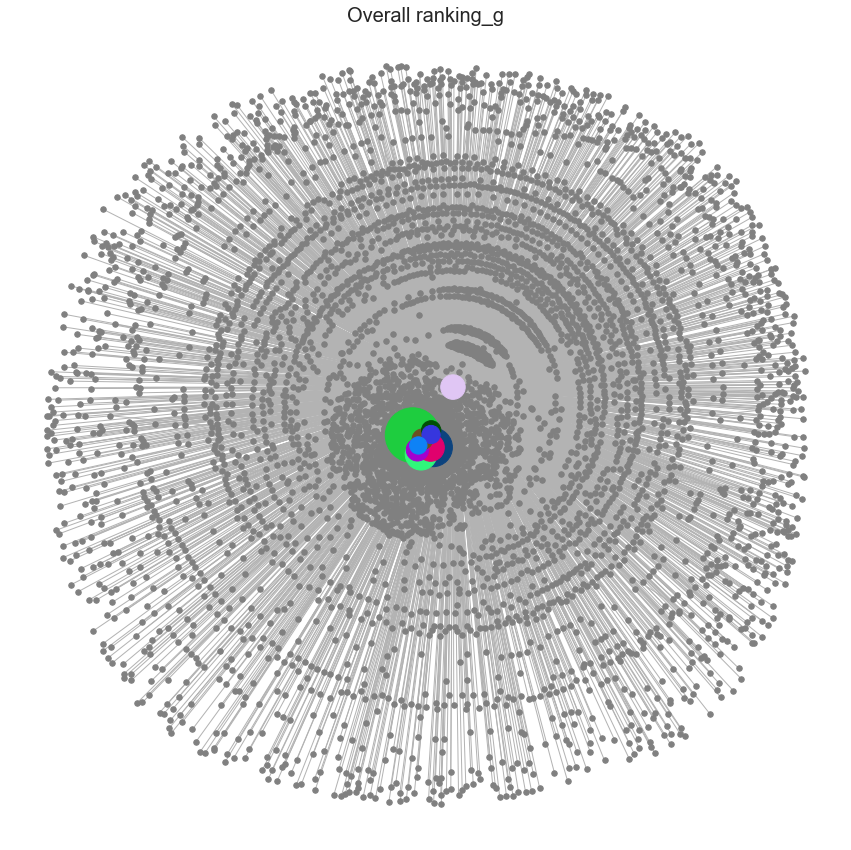

In [188]:
plt.figure(figsize=(15,15))

    
# draw base etwork 
nx.draw_networkx(Graph, pos = layout, node_size = 30, with_labels = False, node_color = 'grey', edge_color = '0.7')

# add bigger nodes in color
top_nodes = [node[0] for node in total_ranking_g][:10]
labels = {i: i for i in top_nodes}
colors = ['#1ECD3F', '#0C437E', '#30F77B', '#E0016D', '#E0C6F4', '#A402CF', '#6C5020', '#014F05', '#3636DE', '#0E82F6']
big_size = 3000
sizes = [big_size/(i+1) for i in range(n)]

nx.draw_networkx_nodes(Graph,pos=layout,nodelist= top_nodes, with_labels = True, node_color=colors, node_size = sizes)

#nx.draw_networkx_labels(G,layout, labels,font_size=16, font_color = 'k') 


plt.title('Overall ranking_g', fontsize = 20)
plt.savefig('overall_nx.png')
plt.axis("off")
plt.show()

# 5. Disease to disease Network

In [61]:
raw_data_predicate = pd.read_csv('COVID_KG_sample.csv')
raw_data_predicate.head()

,subject,predicate,object
0,00340eea543336d54adda18236424de6a5e91c9d,isAboutDisease,EFO_0000544
1,00340eea543336d54adda18236424de6a5e91c9d,isAboutDisease,EFO_0003106
2,00340eea543336d54adda18236424de6a5e91c9d,isAboutDisease,EFO_0009727
3,00340eea543336d54adda18236424de6a5e91c9d,isAboutDisease,HP_0001945
4,00340eea543336d54adda18236424de6a5e91c9d,isAboutDisease,HP_0012735


In [62]:
predicate = raw_data_predicate.predicate
predicate.value_counts()

isAssociatedTo              176088
hasGeneticClue              103103
belongsToTherapeuticArea     22142
isASpecific                  17548
isAboutDisease                5986
isAboutTarget                 2967
Name: predicate, dtype: int64

In [63]:
predicate_type = np.unique( list(predicate))

### Disease and genes informations 

In [64]:
data_full = {}

for pred in predicate_type:
    sub_df = raw_data_predicate[raw_data.predicate == pred]
    node_pairs = []
    for i in range(len(sub_df)):
        pair_edge = sub_df.iloc[i]
        node_pairs.append((pair_edge['subject'],pair_edge['object']))
    data_full[pred] = node_pairs

In [65]:
# edge list between diseases
dis_to_dis = [(diseases_names[link[0]],diseases_names[link[1]]) for link in data_full['hasGeneticClue']]

### Graph duplication and update

In [66]:
Graph2 = Graph.copy()

In [67]:
Graph2.add_edges_from(dis_to_dis)

In [68]:
#layout2 = nx.spring_layout(Graph2)

In [69]:
# Save
#np.save('layout2.npy', layout) 

# Load
layout_dd = np.load('layout2.npy',allow_pickle='TRUE').item()

In [70]:
print('Number of nodes: {}'.format(len(Graph2.nodes)))
print('Number of edges: {}'.format(len(Graph2.edges)))

Number of nodes: 7316
Number of edges: 123644


In [157]:
# Taking the previous overall score (total_ranking), create subrgaphs around each central node defined
def top_subgraphs(G, total_ranking, n):
    
    sub_graphs = {}
    
    top_diseases = [d[0] for d in total_ranking][:n]
    
    edge_list = list(G.edges)
    
    for d in top_diseases:
        
        sub_graphs[d] = {}
        
         
        sub_edglist = [link for link in edge_list if link[0] == d]
        
        sub_graphs[d]['edgelist'] = sub_edglist
        
        sub_graphs[d]['node_list'] = [link[1] for link in sub_edglist if link[0] == d]
        
        sub_graphs[d]['gene_nodes'] = [link[1] for link in sub_edglist if Graph2.nodes[link[1]]['label'] == 'Gene']
        
        sub_graphs[d]['disease_nodes'] = [link[1] for link in sub_edglist if Graph2.nodes[link[1]]['label'] == 'Disease']
        
        sub_graphs[d]['Total Nodes'] = len(sub_graphs[d]['node_list'])
        
        sub_graphs[d]['Total Genes'] = len(sub_graphs[d]['gene_nodes'])
        
        sub_graphs[d]['Total Diseases'] = len(sub_graphs[d]['disease_nodes'])
        
        extended = sub_graphs[d]['node_list'].append(d) 
    
        new_G = nx.Graph()
        
        #new_G.add_nodes_from(sub_graphs[d]['node_list'])
        
        new_G.add_edges_from(sub_graphs[d]['edgelist'])
        
        sub_graphs[d]['layout'] = nx.spring_layout(new_G)
        
        sub_graphs[d]['sub_graph'] = new_G
        
        
    return sub_graphs   

In [173]:
sub_graphs_top = top_subgraphs(Graph2, total_ranking_d, 5)

In [162]:
results = {}
for d in sub_graphs_top:
    results[d] = {}
    results[d]['Total Nodes'] = sub_graphs_top[d]['Total Nodes']
    results[d]['Total Genes'] = sub_graphs_top[d]['Total Genes']
    results[d]['Total Diseases'] = sub_graphs_top[d]['Total Diseases']

In [164]:
pd.DataFrame.from_dict(results).to_csv('top_nodes_comparison.csv')

In [174]:
sub_graph_covid = top_subgraphs(Graph2, covid_score_list, 5)

In [175]:
# Draw each central disease with its own network
def draw_disease_top(sub_graphs_top, name, classification):
    
    plt.figure(figsize=(16,10))
    
    G = sub_graphs_top['sub_graph']
    
    layout = sub_graphs_top['layout']
    
    # draw base etwork 
    nx.draw_networkx(G, pos = layout, node_size = 30, with_labels = False, node_color = 'grey', edge_color = '0.7')
    
    # add bigger nodes in color
    covid = 'COVID'
    labels_minor = {i: i for i in sub_graphs_top['node_list']}
    label_name = {name: name.upper()}
    label_covid = {covid: covid}
        
    diseases_nodes = sub_graphs_top['disease_nodes']
    
    genes_nodes = sub_graphs_top['gene_nodes']
    
    try:
        del labels_minor[name]
    except:
        print('ok')
    
    nx.draw_networkx_nodes(G,pos=layout,nodelist= genes_nodes, with_labels = True, node_color='green', node_size = 700)

    nx.draw_networkx_nodes(G,pos=layout,nodelist= diseases_nodes, with_labels = True, node_color='red', node_size = 1000)

    nx.draw_networkx_nodes(G,pos=layout,nodelist= [name], with_labels = True, node_color='yellow', node_size = 5000)

    nx.draw_networkx_nodes(G,pos=layout,nodelist= [covid], with_labels = True, node_color='blue', node_size = 2200)

    nx.draw_networkx_labels(G,layout, labels_minor, font_size=12, font_color = 'k') 
    nx.draw_networkx_labels(G,layout, label_name, font_size=15, font_color = 'k')
    nx.draw_networkx_labels(G,layout, label_covid, font_size=15, font_color = 'white')
    
    
    plt.title(name.upper(), fontsize = 20)
    plt.savefig(classification + 'final' + str(name)+'.png')
    plt.axis("off")
    plt.show()

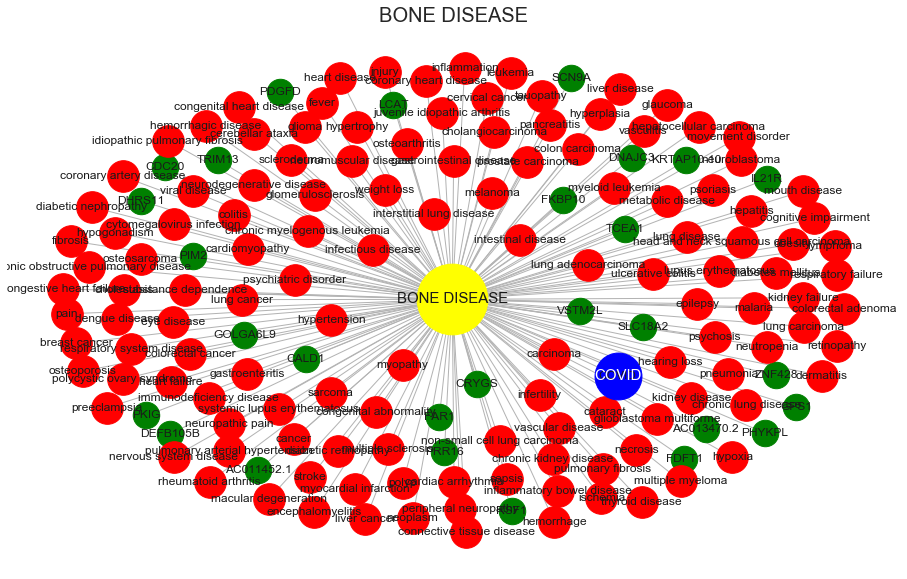

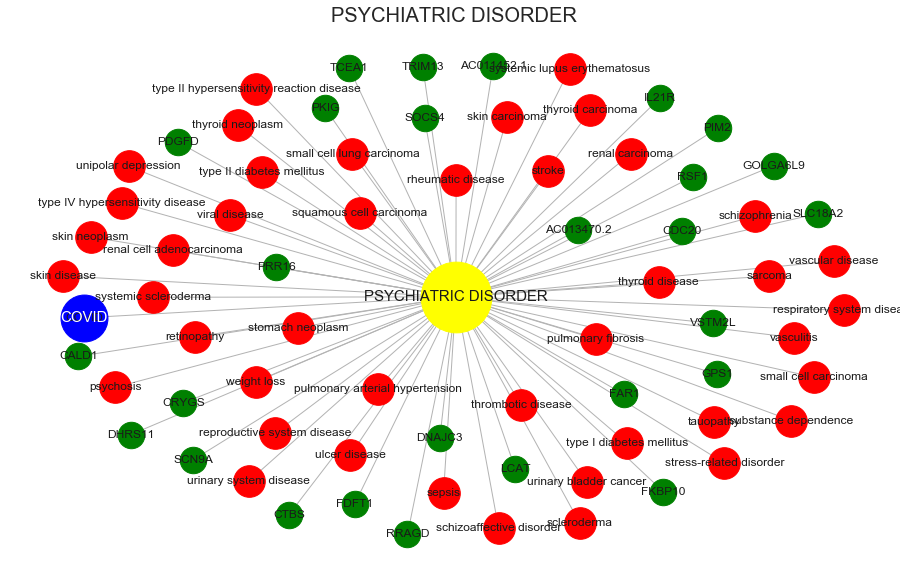

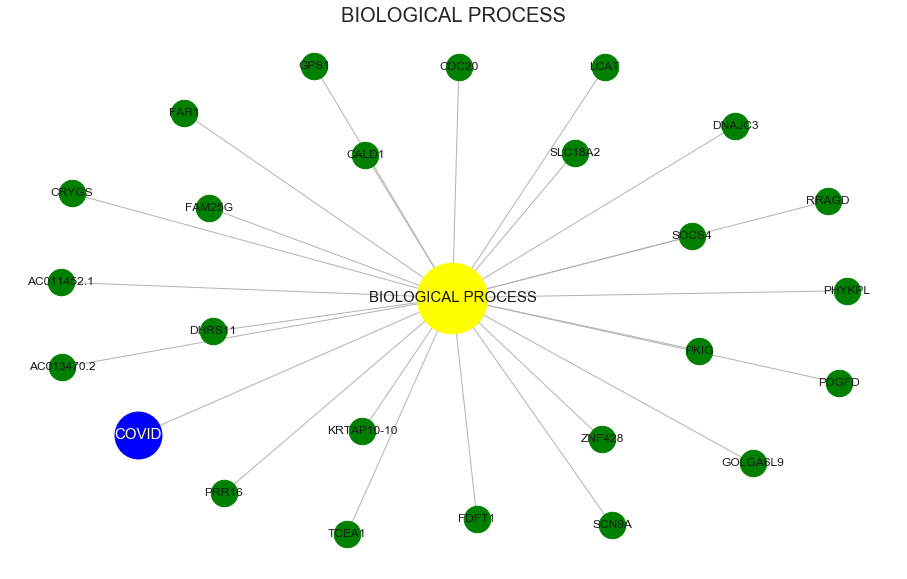

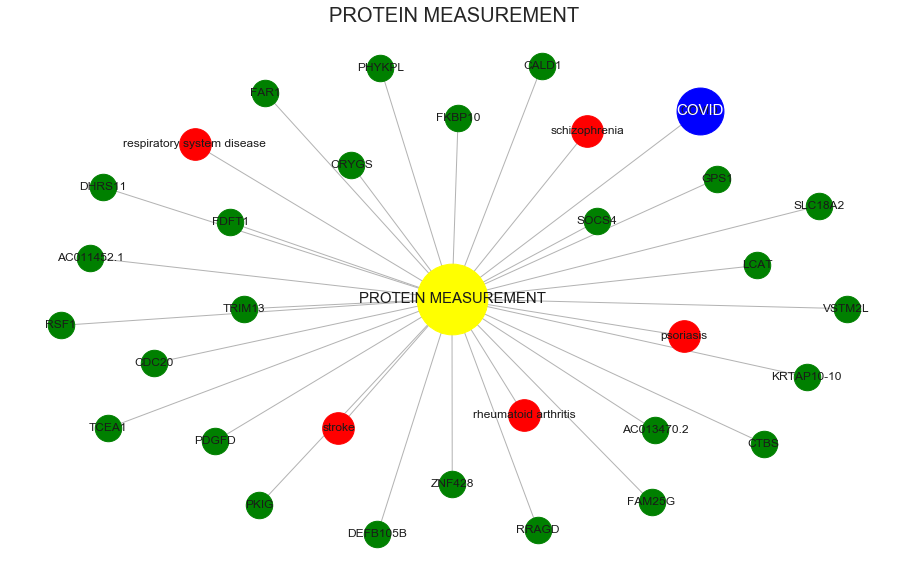

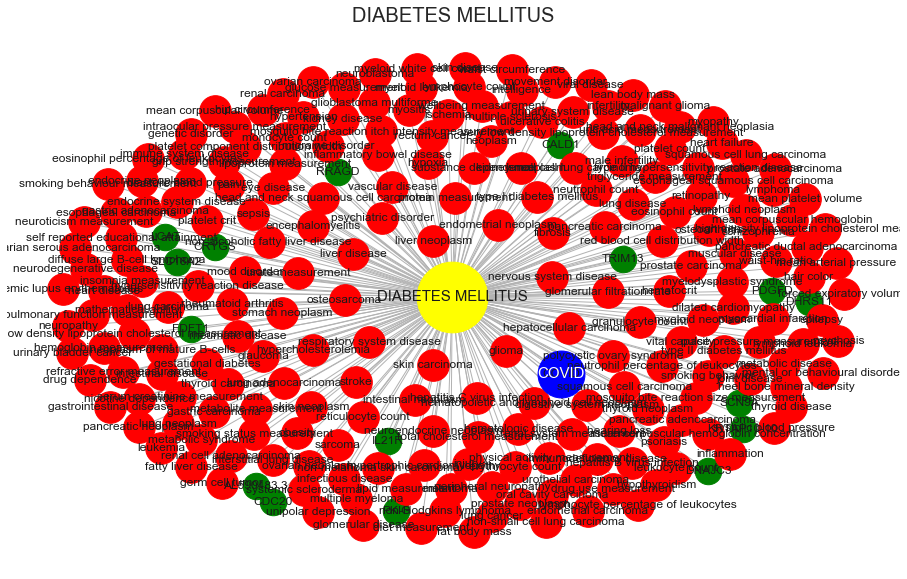

In [176]:
for d in sub_graphs_top:
    draw_disease_top(sub_graphs_top[d], d, 'OVERALL')

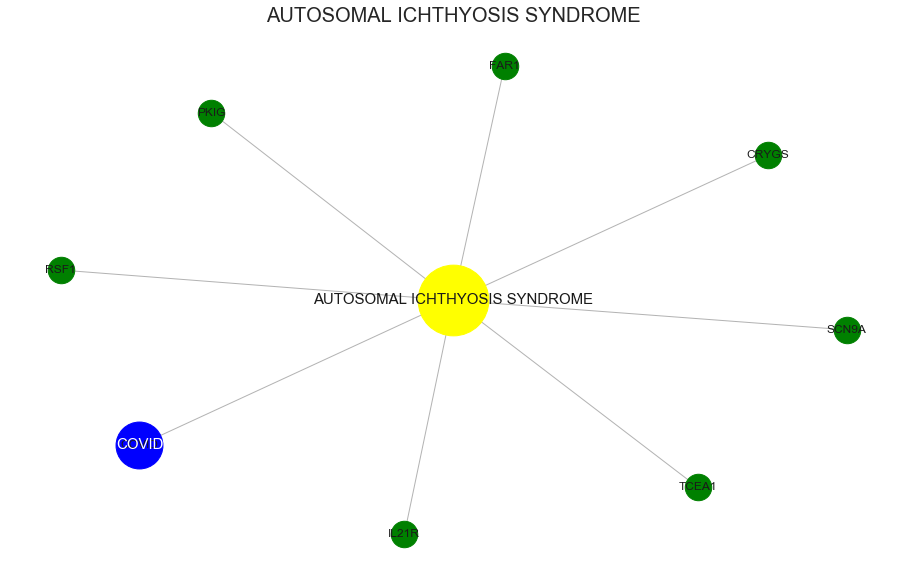

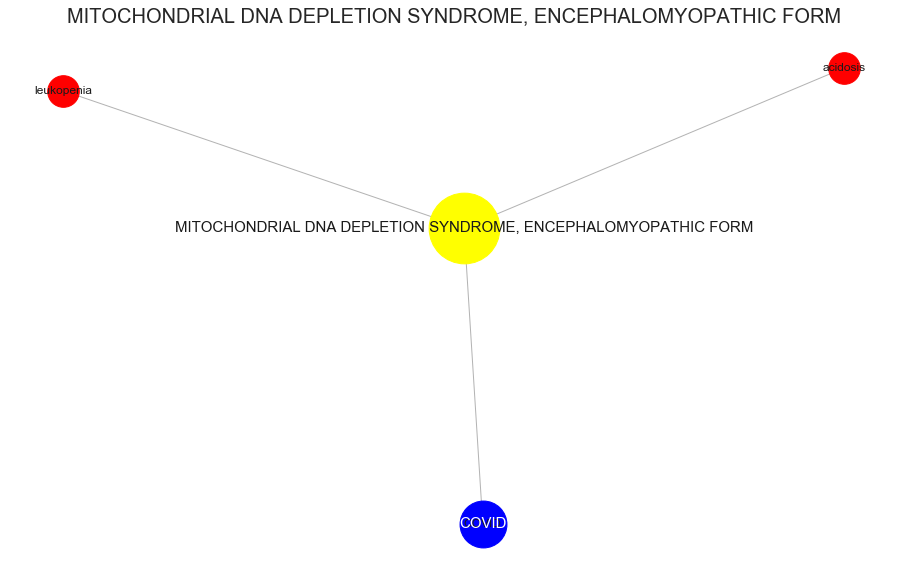

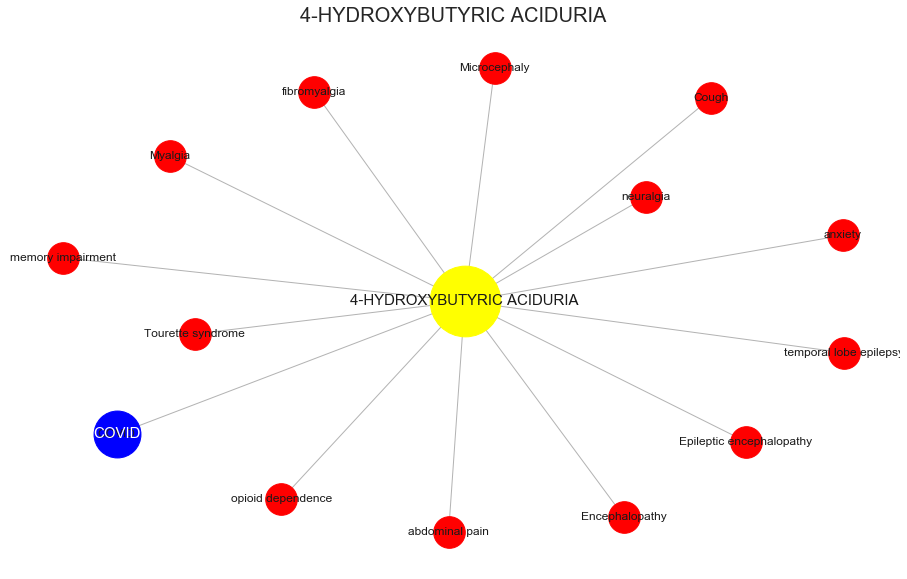

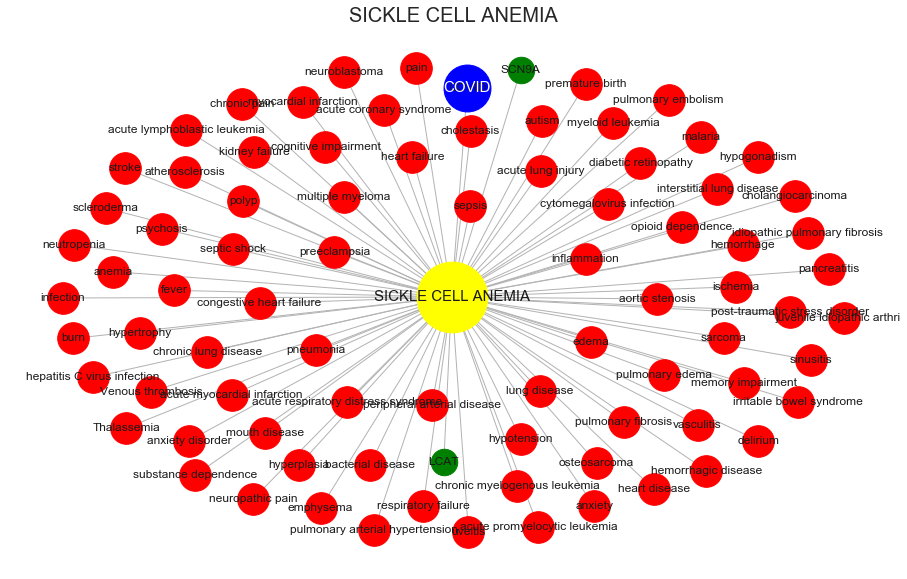

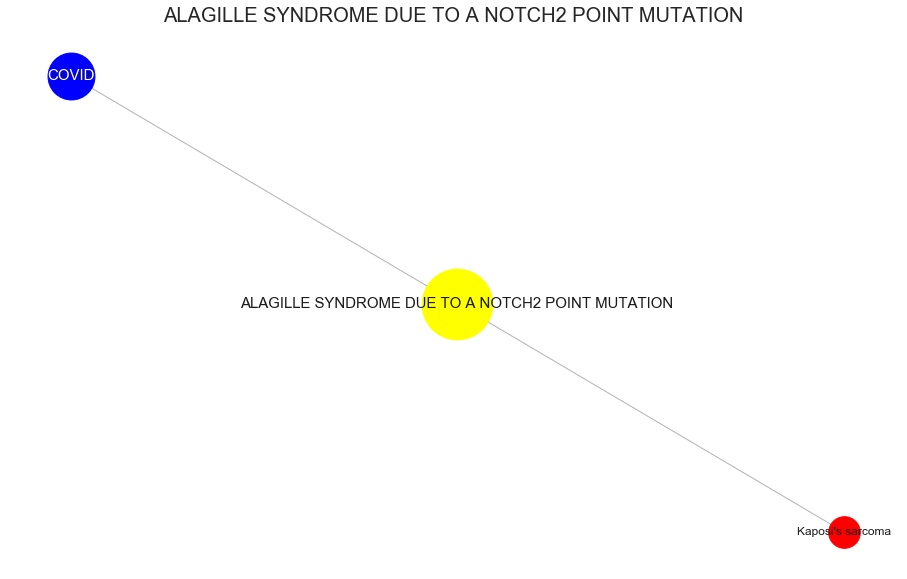

In [177]:
for d in sub_graph_covid:
    draw_disease_top(sub_graph_covid[d], d, 'COVID')

# 6. Clustering

In [76]:
# group diseases in which category of diseases they belong to
generic = {}
for link in data_full['isASpecific']:
    try:
        generic[diseases_names[link[1]]].append(diseases_names[link[0]])
    except:
        generic[diseases_names[link[1]]] = []
        generic[diseases_names[link[1]]].append(diseases_names[link[0]])
    

In [77]:
generic_names = list(generic.keys())

In [79]:
# rank them according to size
generic_sizes = [(gen, len(generic[gen])) for gen in generic]
generic_sizes_dict = {gen: len(generic[gen]) for gen in generic}

In [80]:
# rank them according to link to covid
generic_covid_score = []
generic_covid_score_dict = {}

for gen in generic:
    belong = generic[gen]
    scores = []
    for n in belong:
        try:
            scores.append(covid_score[n])
        except KeyError:
            continue
    generic_covid_score.append((gen, np.sum(scores)))
    generic_covid_score_dict[gen] = np.sum(scores)

In [83]:
#sort
generic_sizes.sort(key=custom_sort, reverse = True)
generic_covid_score.sort(key=custom_sort, reverse = True)

In [84]:
# draw the clusters (categories of disease) around the covid on different paramters
def draw_covid_generic(generic_score, n, name, edge_factor, node_factor):
    nodes_and_score = generic_score[:n]
    nodes = [nodes_and_score[i][0] for i in range(len(nodes_and_score))]
    
    w_edges = []
    simple_edges = []
    for node in nodes_and_score:
        w_edges.append(('COVID', node[0], node[1]))
        simple_edges.append(('COVID', node[0]))
    G = nx.Graph()
    
    G.add_weighted_edges_from(w_edges)
    
    layout = nx.spring_layout(G)
    plt.figure(figsize=(16,10))
    # draw base etwork 
    nx.draw_networkx(G, pos = layout, node_size = 30, with_labels = False, node_color = 'grey', edge_color = '0.7')
    
    # add bigger nodes in color
    covid = 'COVID'
    labels_minor = {nodes[i]: nodes[i] for i in range(len(nodes))}
    label_covid = {covid: covid}
    
    edge_size = [nodes_and_score[i][1]*edge_factor for i in range(len(nodes_and_score))]
    
    node_size = [nodes_and_score[i][1]*node_factor for i in range(len(nodes_and_score))]
    
    nx.draw_networkx_edges(G, pos = layout, edgelist = simple_edges, width = edge_size, edge_color = 'grey')
    
    nx.draw_networkx_nodes(G,pos=layout,nodelist= nodes,node_size =  node_size, with_labels = True, node_color='red')

    nx.draw_networkx_nodes(G,pos=layout,nodelist= [covid], with_labels = True, node_color='blue', node_size = 3000)

    nx.draw_networkx_labels(G,layout, labels_minor, font_size=12, font_color = 'k') 
    
    nx.draw_networkx_labels(G,layout, label_covid, font_size=15, font_color = 'white')
    
    
    plt.title(name.upper(), fontsize = 20)
    plt.savefig('final' + str(name)+'.png')
    plt.axis("off")
    plt.show()
        

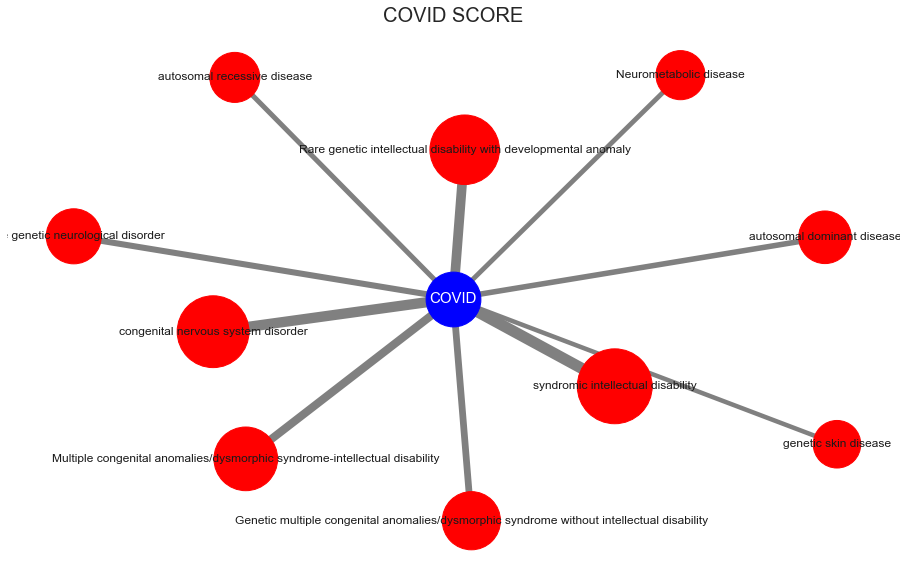

In [190]:
draw_covid_generic(generic_covid_score, 10, 'COVID SCORE', edge_factor = 20, node_factor = 1e4)

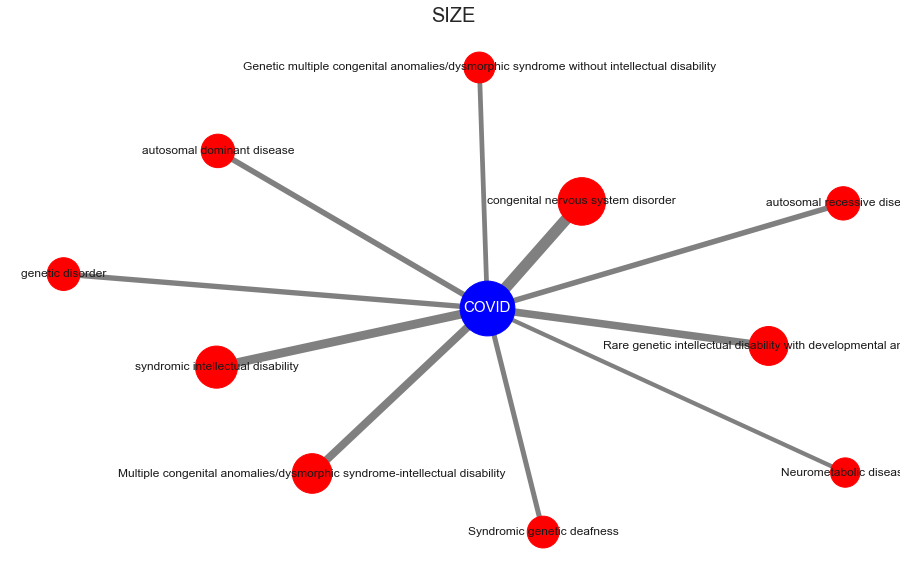

In [189]:
draw_covid_generic(generic_sizes, 10, 'SIZE', edge_factor = 0.05, node_factor = 10)

## Let's norm the influence to the size

In [88]:
normed_generic = [(gen, float(generic_covid_score_dict[gen]/generic_sizes_dict[gen])) for gen in generic_sizes_dict if generic_sizes_dict[gen] !=0]

In [89]:
normed_generic.sort(key=custom_sort, reverse = True)

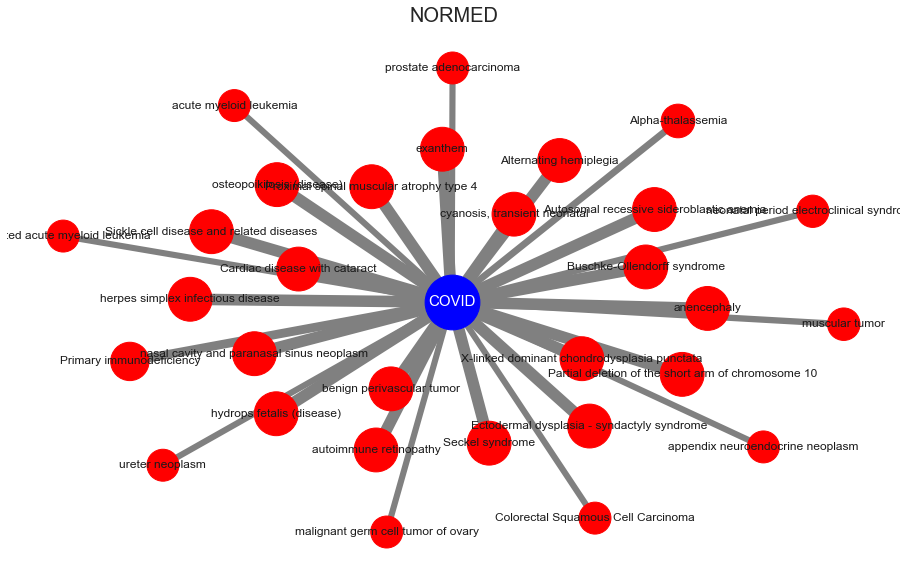

In [90]:
draw_covid_generic(normed_generic, 30, 'NORMED', edge_factor = 3e2, node_factor = 5e4)